In [7]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
import plotly.express as px

warnings.filterwarnings('ignore')

In [8]:
df = pd.read_csv('weatherAUS.csv')
df.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No


In [9]:
df.shape

(145460, 23)

In [10]:
df.columns

Index(['Date', 'Location', 'MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation',
       'Sunshine', 'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm',
       'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
       'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am',
       'Temp3pm', 'RainToday', 'RainTomorrow'],
      dtype='object')

In [11]:
df.isnull().sum()

Date                 0
Location             0
MinTemp           1485
MaxTemp           1261
Rainfall          3261
Evaporation      62790
Sunshine         69835
WindGustDir      10326
WindGustSpeed    10263
WindDir9am       10566
WindDir3pm        4228
WindSpeed9am      1767
WindSpeed3pm      3062
Humidity9am       2654
Humidity3pm       4507
Pressure9am      15065
Pressure3pm      15028
Cloud9am         55888
Cloud3pm         59358
Temp9am           1767
Temp3pm           3609
RainToday         3261
RainTomorrow      3267
dtype: int64

In [12]:
for column in df.columns:
    print(column,':',round(df[column].isnull().sum()/df.shape[0] * 100, ndigits=2),'% of missing values')

Date : 0.0 % of missing values
Location : 0.0 % of missing values
MinTemp : 1.02 % of missing values
MaxTemp : 0.87 % of missing values
Rainfall : 2.24 % of missing values
Evaporation : 43.17 % of missing values
Sunshine : 48.01 % of missing values
WindGustDir : 7.1 % of missing values
WindGustSpeed : 7.06 % of missing values
WindDir9am : 7.26 % of missing values
WindDir3pm : 2.91 % of missing values
WindSpeed9am : 1.21 % of missing values
WindSpeed3pm : 2.11 % of missing values
Humidity9am : 1.82 % of missing values
Humidity3pm : 3.1 % of missing values
Pressure9am : 10.36 % of missing values
Pressure3pm : 10.33 % of missing values
Cloud9am : 38.42 % of missing values
Cloud3pm : 40.81 % of missing values
Temp9am : 1.21 % of missing values
Temp3pm : 2.48 % of missing values
RainToday : 2.24 % of missing values
RainTomorrow : 2.25 % of missing values


- There are few features absorbed which has null values which are closer are higher than 40 precentage
- Removing the null values from the target variable('RainTomorrow') since every less percent records are only missing from the dataset.

In [13]:
df.dropna(subset = ['RainTomorrow'],axis=0,inplace=True)

In [14]:
for col in df.columns:
    print(col,':',df[col].nunique())

Date : 3436
Location : 49
MinTemp : 389
MaxTemp : 505
Rainfall : 679
Evaporation : 356
Sunshine : 145
WindGustDir : 16
WindGustSpeed : 67
WindDir9am : 16
WindDir3pm : 16
WindSpeed9am : 43
WindSpeed3pm : 44
Humidity9am : 101
Humidity3pm : 101
Pressure9am : 546
Pressure3pm : 549
Cloud9am : 10
Cloud3pm : 10
Temp9am : 440
Temp3pm : 500
RainToday : 2
RainTomorrow : 2


In [15]:
categorical_features = [feature for feature in df.columns if df[feature].nunique() < 20]
categorical_features

['WindGustDir',
 'WindDir9am',
 'WindDir3pm',
 'Cloud9am',
 'Cloud3pm',
 'RainToday',
 'RainTomorrow']

features which consits of less than 20 unique characters are considred as categorical features

In [16]:
numerical_features = [feature for feature in df.columns if df[feature].nunique() > 20]
numerical_features

['Date',
 'Location',
 'MinTemp',
 'MaxTemp',
 'Rainfall',
 'Evaporation',
 'Sunshine',
 'WindGustSpeed',
 'WindSpeed9am',
 'WindSpeed3pm',
 'Humidity9am',
 'Humidity3pm',
 'Pressure9am',
 'Pressure3pm',
 'Temp9am',
 'Temp3pm']

features which consits of more than 20 unique characters are considred as Numerical features

In [17]:
features_with_na = [feature for feature in df.columns if df[feature].isnull().sum()>1]

features_with_na

['MinTemp',
 'MaxTemp',
 'Rainfall',
 'Evaporation',
 'Sunshine',
 'WindGustDir',
 'WindGustSpeed',
 'WindDir9am',
 'WindDir3pm',
 'WindSpeed9am',
 'WindSpeed3pm',
 'Humidity9am',
 'Humidity3pm',
 'Pressure9am',
 'Pressure3pm',
 'Cloud9am',
 'Cloud3pm',
 'Temp9am',
 'Temp3pm',
 'RainToday']

In [18]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
MinTemp,141556.0,12.186400,6.403283,-8.5,7.6,12.0,16.8,33.9
MaxTemp,141871.0,23.226784,7.117618,-4.8,17.9,22.6,28.2,48.1
Rainfall,140787.0,2.349974,8.465173,0.0,0.0,0.0,0.8,371.0
Evaporation,81350.0,5.469824,4.188537,0.0,2.6,4.8,7.4,145.0
Sunshine,74377.0,7.624853,3.781525,0.0,4.9,8.5,10.6,14.5
WindGustSpeed,132923.0,39.984292,13.588801,6.0,31.0,39.0,48.0,135.0
WindSpeed9am,140845.0,14.001988,8.893337,0.0,7.0,13.0,19.0,130.0
WindSpeed3pm,139563.0,18.637576,8.803345,0.0,13.0,19.0,24.0,87.0
Humidity9am,140419.0,68.843810,19.051293,0.0,57.0,70.0,83.0,100.0
Humidity3pm,138583.0,51.482606,20.797772,0.0,37.0,52.0,66.0,100.0


There is a huge difference from the minimum and the maximum value for few of the features.

In [19]:
df[(df['MinTemp'] < 0) & (df['RainToday'] == 'Yes')].head()


,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
250,2009-08-08,Albury,-0.8,12.9,4.2,NaN,NaN,WNW,24.0,E,...,78.0,50.0,1026.4,1023.0,NaN,NaN,4.4,12.3,Yes,No
624,2010-08-17,Albury,-1.0,12.1,3.8,NaN,NaN,E,15.0,NaN,...,87.0,55.0,1024.1,1020.4,NaN,1.0,4.5,11.3,Yes,No
925,2011-07-14,Albury,-0.3,12.6,4.0,NaN,NaN,SW,15.0,S,...,99.0,65.0,1029.3,1029.7,8.0,NaN,4.0,10.7,Yes,No
1981,2014-08-02,Albury,-1.1,11.5,2.2,NaN,NaN,W,24.0,E,...,89.0,56.0,1029.1,1029.7,NaN,NaN,3.2,11.2,Yes,No
2348,2015-08-04,Albury,-2.4,8.6,1.4,NaN,NaN,W,30.0,ENE,...,85.0,55.0,1025.1,1021.9,NaN,8.0,2.5,7.7,Yes,Yes


Even with the negative temperature it is recorded as rainy on that current day

In [20]:
print(df['WindSpeed9am'].mean())
print(df['WindSpeed3pm'].mean())


14.001988000994
18.63757586179718


The windspeed at evening is higher than morning but not with huge difference

In [21]:
df[(df['RainToday'] == 'Yes') & (df['RainTomorrow'] == 'Yes')].shape

(14597, 23)

In [22]:
df[(df['RainToday'] == 'No') & (df['RainTomorrow'] == 'Yes')].shape

(16604, 23)

In [23]:
df[(df['RainToday'] == 'No') & (df['RainTomorrow'] == 'No')].shape

(92728, 23)

In [24]:
df[(df['RainToday'] == 'Yes') & (df['RainTomorrow'] == 'No')].shape

(16858, 23)

In most cases if today was a non-rainy day then tommorow is also non-rainy day.

In [25]:
print('Rain Today')
temp = df[df['RainToday'] == 'Yes']
print('Minimum clouds during rainy day at morning :',temp.Cloud9am.min())
print('Maximum clouds during rainy day at morning :',temp.Cloud9am.max())
print('Average clouds during rainy day at morning :',temp.Cloud9am.mean())

print('\n')

print('Rain Tomorrow')
temp = df[df['RainTomorrow'] == 'Yes']
print('Minimum clouds on Tomorrow rainy day at morning :',temp.Cloud9am.min())
print('Maximum clouds on Tomorrow rainy day at morning :',temp.Cloud9am.max())
print('Average clouds on Tomorrow rainy day at morning :',temp.Cloud9am.mean())

Rain Today
Minimum clouds during rainy day at morning : 0.0
Maximum clouds during rainy day at morning : 9.0
Average clouds during rainy day at morning : 6.018474088291747


Rain Tomorrow
Minimum clouds on Tomorrow rainy day at morning : 0.0
Maximum clouds on Tomorrow rainy day at morning : 8.0
Average clouds on Tomorrow rainy day at morning : 6.09999030161963


In [26]:
print('Rain Today')
temp = df[df['RainToday'] == 'No']
print('Minimum clouds during non-rainy day at morning :',temp.Cloud9am.min())
print('Maximum clouds during non-rainy day at morning :',temp.Cloud9am.max())
print('Average clouds during non-rainy day at morning :',temp.Cloud9am.mean())

print('\n')

print('Rain Tomorrow')
temp = df[df['RainTomorrow'] == 'No']
print('Minimum clouds on Tomorrow non-rainy day at morning :',temp.Cloud9am.min())
print('Maximum clouds on Tomorrow non-rainy day at morning :',temp.Cloud9am.max())
print('Average clouds on Tomorrow non-rainy day at morning :',temp.Cloud9am.mean())

Rain Today
Minimum clouds during non-rainy day at morning : 0.0
Maximum clouds during non-rainy day at morning : 9.0
Average clouds during non-rainy day at morning : 3.939796797480764


Rain Tomorrow
Minimum clouds on Tomorrow non-rainy day at morning : 0.0
Maximum clouds on Tomorrow non-rainy day at morning : 9.0
Average clouds on Tomorrow non-rainy day at morning : 3.9322820037105752


In [27]:
print('Rain Today')
temp = df[df['RainToday'] == 'Yes']
print('Minimum clouds during rainy day at evening :',temp.Cloud3pm.min())
print('Maximum clouds during rainy day at evening :',temp.Cloud3pm.max())
print('Average clouds during rainy day at evening :',temp.Cloud3pm.mean())

print('\n')

print('Rain Tomorrow')
temp = df[df['RainTomorrow'] == 'Yes']
print('Minimum clouds on Tomorrow rainy day at evening :',temp.Cloud3pm.min())
print('Maximum clouds on Tomorrow rainy day at evening :',temp.Cloud3pm.max())
print('Average clouds on Tomorrow rainy day at evening :',temp.Cloud3pm.mean())

Rain Today
Minimum clouds during rainy day at evening : 0.0
Maximum clouds during rainy day at evening : 8.0
Average clouds during rainy day at evening : 5.8270744098017735


Rain Tomorrow
Minimum clouds on Tomorrow rainy day at evening : 0.0
Maximum clouds on Tomorrow rainy day at evening : 8.0
Average clouds on Tomorrow rainy day at evening : 6.360065063091483


In [28]:
print('Rain Today')
temp = df[df['RainToday'] == 'No']
print('Minimum clouds during non-rainy day at evening :',temp.Cloud3pm.min())
print('Maximum clouds during non-rainy day at evening :',temp.Cloud3pm.max())
print('Average clouds during non-rainy day at evening :',temp.Cloud3pm.mean())

print('\n')

print('Rain Tomorrow')
temp = df[df['RainTomorrow'] == 'No']
print('Minimum clouds on Tomorrow non-rainy day at evening :',temp.Cloud3pm.min())
print('Maximum clouds on Tomorrow non-rainy day at evening :',temp.Cloud3pm.max())
print('Average clouds on Tomorrow non-rainy day at evening :',temp.Cloud3pm.mean())

Rain Today
Minimum clouds during non-rainy day at evening : 0.0
Maximum clouds during non-rainy day at evening : 9.0
Average clouds during non-rainy day at evening : 4.086651706260156


Rain Tomorrow
Minimum clouds on Tomorrow non-rainy day at evening : 0.0
Maximum clouds on Tomorrow non-rainy day at evening : 9.0
Average clouds on Tomorrow non-rainy day at evening : 3.921895974448782


The Clouds didn't differ much during morning or at evening even if its rainy or non-rainy day with comparison of today and Tomorrow

In [38]:
# RainTomorrow = np.where(df['RainTomorrow'] == 'Yes',1,0)

In [39]:
# temp = df[['Date','RainTomorrow']]
# temp['RainTomorrow'] = RainTomorrow
# temp

dtype('int64')

In [31]:
# mask = temp[temp.stack().str.contains('2008').any(level=0)]
# mask.set_index('Date', inplace=True)
# mask.index = pd.to_datetime(mask.index)
# mask = mask.resample('1M').sum()
# mask

In [40]:
# # sns.barplot(x=mask.index,y='RainTomorrow',data=mask)
# fig = px.bar(mask, x=mask.index, y='RainTomorrow')
# fig.show()

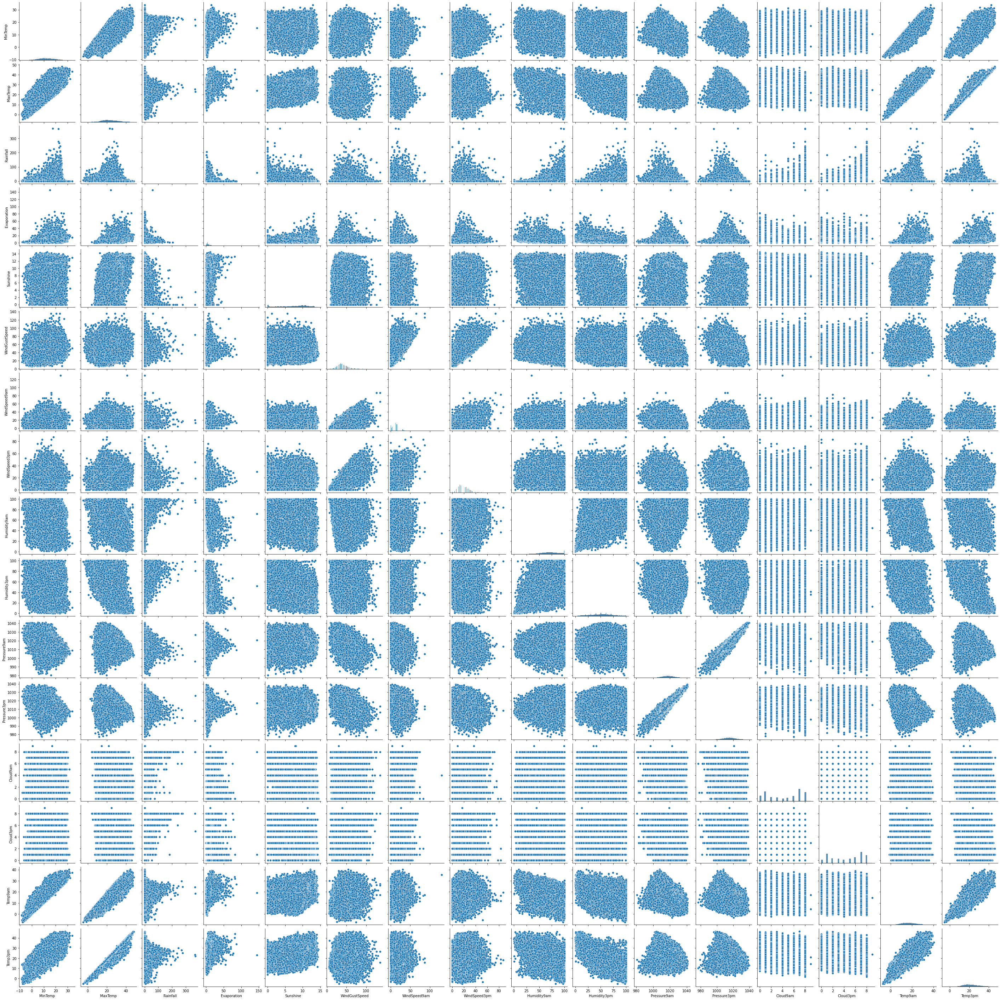

In [35]:
#Pair plot
sns.pairplot(df)

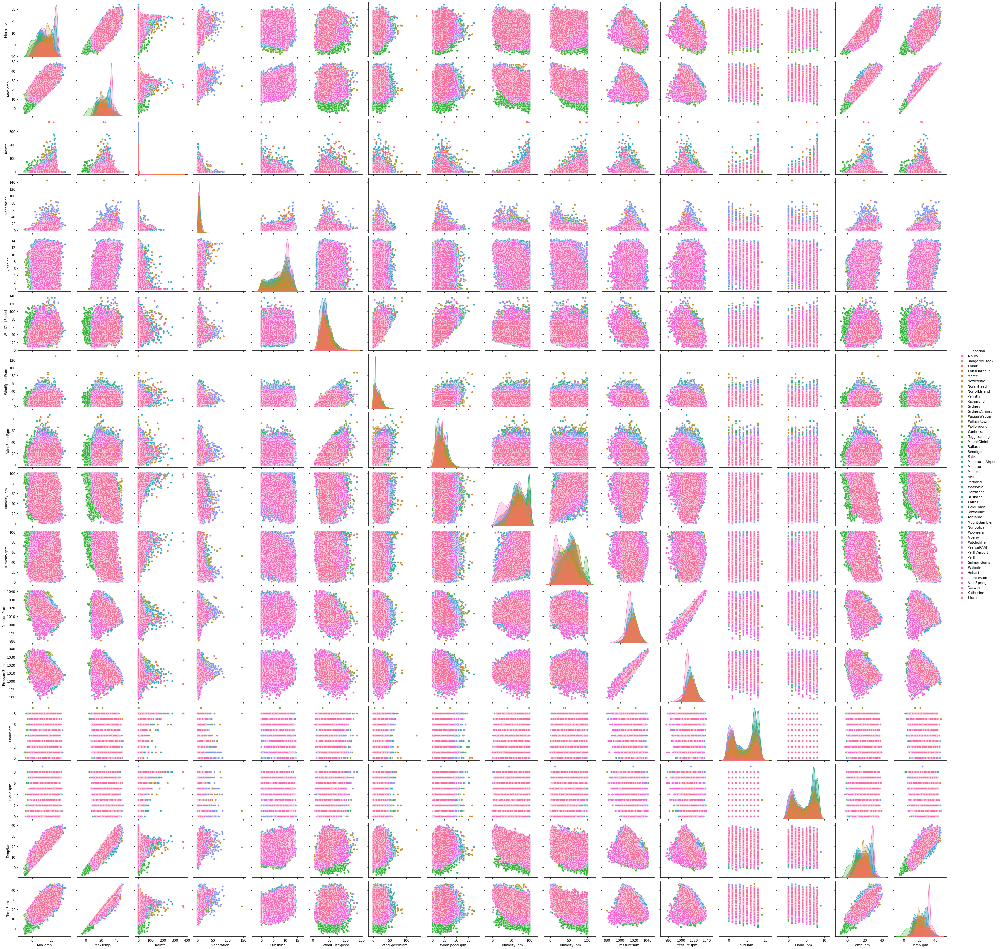

In [37]:
#Pair plot
# sns.pairplot(df,hue = 'Location')